In [1]:
from pathlib import Path

from adain_model import AdaINModel, AdaINLoss
from adain_datamodule import AdaINDataModule
from adain_trainer import AdaINTrainer

import os
os.environ["KERAS_BACKEND"] = "torch"
import keras
import torch

In [2]:
run_id = 'b66fc229f98147f4b0fa6b0882f5aa40'
train_epochs = 34
start_epoch = 19
dataset_size = 100000
lr = 1e-4
decay_rate = 5e-5
decay_steps = 1
style_loss_weight = 3
tv_weight = 0
additional_tags = {'Upsampling' : 'Nearest', 'Style_loss' : 'Gram_matrix'}

In [3]:
dm = AdaINDataModule(Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/unlabeled2017/"), Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/WikiArt/"), dataset_size=dataset_size, seed=4444, batch_size=8)
if run_id != '' :
    model = AdaINModel.load_from_mlflow(run_id, Path("D:/Python/ML Flow/mlruns"))
else :
    model = AdaINModel()
    model.compile(optimizer='adam')
if decay_rate != 0 :
    model.optimizer.learning_rate = keras.optimizers.schedules.InverseTimeDecay(initial_learning_rate=lr, decay_steps=decay_steps, decay_rate=decay_rate)
else :
    model.optimizer.learning_rate = lr
model.loss_ = AdaINLoss(style_loss_weight=style_loss_weight, tv_weight=tv_weight)

d:\Python\StyleTransferAI\Lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 38 variables whereas the saved optimizer has 37 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [4]:
total_epochs = start_epoch + train_epochs
trainer = AdaINTrainer(model, dm, 'adam', mlflow_dir=Path("D:/Python/ML Flow/mlruns"), mlflow_tags={"Dataset size" : dataset_size, "Real training" : True, "Total epochs" : f'{total_epochs} ({10*total_epochs} Keras epochs)', "Start epoch" : start_epoch, **additional_tags})
trainer.train(epochs=10*train_epochs, steps_per_epoch=1000, log_every_n_epochs=10, validation_steps=125, test_steps=125)

Initiating datasets...
Compiling the model...
Model is ready to be trained
Training the model...


Epoch 1/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 569s 569ms/step - loss: 247437.8281 - val_loss: 271345.7188
Epoch 2/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 569s 569ms/step - loss: 239894.9375 - val_loss: 252217.3594
Epoch 3/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 573s 573ms/step - loss: 269674.8750 - val_loss: 235819.4531
Epoch 4/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 573s 574ms/step - loss: 230243.5000 - val_loss: 941210.8750
Epoch 5/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 574s 574ms/step - loss: 384977.4375 - val_loss: 260244.4688
Epoch 6/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 575ms/step - loss: 283063.5000 - val_loss: 224700.7031
Epoch 7/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 575ms/step - loss: 241493.9375 - val_loss: 307604.4688
Epoch 8/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 575ms/step - loss: 285966.0938 - val_loss: 273144.9688
Epoch 9/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 574s 574ms/step - loss: 275814.5000 - val_loss: 230518.4062
Epoch 10/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 574s 574ms/step - loss: 257813.3906 - v

Epoch 11/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 259103.0938 - val_loss: 261337.5625
Epoch 12/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 245314.1875 - val_loss: 249537.3438
Epoch 13/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 554s 554ms/step - loss: 253749.2344 - val_loss: 346039.7500
Epoch 14/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 555s 555ms/step - loss: 296601.5625 - val_loss: 273684.4062
Epoch 15/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 236512.1562 - val_loss: 256416.4844
Epoch 16/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 225660.7031 - val_loss: 253096.5156
Epoch 17/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 239234.8281 - val_loss: 267628.5312
Epoch 18/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 250193.0312 - val_loss: 232133.2656
Epoch 19/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 229835.6250 - val_loss: 245659.6250
Epoch 20/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 235023

Epoch 21/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 232201.0469 - val_loss: 228630.5312
Epoch 22/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 214403.2656 - val_loss: 237745.8594
Epoch 23/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 283543.5625 - val_loss: 236815.1719
Epoch 24/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 223650.3125 - val_loss: 231102.7969
Epoch 25/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 281474.5312 - val_loss: 238492.6719
Epoch 26/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 218945.6094 - val_loss: 284734.5938
Epoch 27/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 237540.6250 - val_loss: 220688.9219
Epoch 28/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 223189.7969 - val_loss: 235603.3281
Epoch 29/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 219851.2656 - val_loss: 240154.2969
Epoch 30/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 230316

Epoch 31/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 241800.3281 - val_loss: 241329.8125
Epoch 32/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 551s 551ms/step - loss: 214432.5312 - val_loss: 209418.6406
Epoch 33/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 562ms/step - loss: 244618.4844 - val_loss: 216549.7500
Epoch 34/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 226296.8438 - val_loss: 221127.8594
Epoch 35/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 566s 566ms/step - loss: 232798.9375 - val_loss: 205147.0312
Epoch 36/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 224793.2344 - val_loss: 210333.8750
Epoch 37/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 218814.2344 - val_loss: 274490.8438
Epoch 38/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 567s 567ms/step - loss: 226777.2969 - val_loss: 265732.1250
Epoch 39/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 567s 567ms/step - loss: 230803.9219 - val_loss: 208215.8750
Epoch 40/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 572s 572ms/step - loss: 221807

Epoch 41/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 554s 554ms/step - loss: 206518.2812 - val_loss: 220202.6406
Epoch 42/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 553s 553ms/step - loss: 223826.1719 - val_loss: 249485.8281
Epoch 43/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 214773.7969 - val_loss: 268446.0625
Epoch 44/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 557ms/step - loss: 277666.8125 - val_loss: 283081.3438
Epoch 45/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 274542.7812 - val_loss: 218027.5938
Epoch 46/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 217847.6719 - val_loss: 216950.0000
Epoch 47/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 234759.5625 - val_loss: 217675.0469
Epoch 48/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 216891.9219 - val_loss: 232982.3125
Epoch 49/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 561ms/step - loss: 213555.6719 - val_loss: 190957.7812
Epoch 50/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 206052

Epoch 51/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 205807.1250 - val_loss: 222776.7188
Epoch 52/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 554s 554ms/step - loss: 203368.0312 - val_loss: 223749.3906
Epoch 53/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 566s 566ms/step - loss: 202613.9844 - val_loss: 196636.5156
Epoch 54/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 567s 567ms/step - loss: 208772.5469 - val_loss: 214329.0312
Epoch 55/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 567s 567ms/step - loss: 208476.9844 - val_loss: 216760.8438
Epoch 56/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 568s 568ms/step - loss: 230638.2031 - val_loss: 198636.1250
Epoch 57/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 568s 568ms/step - loss: 261589.7656 - val_loss: 230665.1875
Epoch 58/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 567s 567ms/step - loss: 217531.4375 - val_loss: 216530.9062
Epoch 59/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 567s 567ms/step - loss: 202280.1094 - val_loss: 225324.2188
Epoch 60/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 570s 570ms/step - loss: 195248

Epoch 61/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 222338.7344 - val_loss: 208541.9531
Epoch 62/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 202143.7656 - val_loss: 227123.5625
Epoch 63/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 214160.6406 - val_loss: 201264.6094
Epoch 64/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 567s 567ms/step - loss: 214760.0156 - val_loss: 247850.4219
Epoch 65/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 566s 566ms/step - loss: 207530.4375 - val_loss: 203481.1562
Epoch 66/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 210088.9219 - val_loss: 189924.5781
Epoch 67/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 568s 568ms/step - loss: 205153.3750 - val_loss: 209353.8281
Epoch 68/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 567s 567ms/step - loss: 196924.5938 - val_loss: 218635.6250
Epoch 69/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 568s 568ms/step - loss: 208785.6094 - val_loss: 200329.7969
Epoch 70/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 569s 569ms/step - loss: 207370

Epoch 71/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 205731.6250 - val_loss: 201262.6562
Epoch 72/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 205736.9688 - val_loss: 228803.2969
Epoch 73/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 570s 570ms/step - loss: 266434.7812 - val_loss: 240073.6875
Epoch 74/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 569s 569ms/step - loss: 208526.5781 - val_loss: 200321.5469
Epoch 75/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 568s 568ms/step - loss: 198158.5156 - val_loss: 236581.2344
Epoch 76/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 571s 571ms/step - loss: 201092.6094 - val_loss: 217265.7344
Epoch 77/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 570s 570ms/step - loss: 203182.1719 - val_loss: 190369.8594
Epoch 78/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 570s 570ms/step - loss: 213796.8438 - val_loss: 189252.4531
Epoch 79/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 569s 569ms/step - loss: 195698.5938 - val_loss: 198079.2344
Epoch 80/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 568s 568ms/step - loss: 196695

Epoch 81/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 201995.2656 - val_loss: 218843.1719
Epoch 82/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 196364.3438 - val_loss: 238930.8125
Epoch 83/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 212211.5469 - val_loss: 195659.6250
Epoch 84/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 568s 568ms/step - loss: 204368.0156 - val_loss: 203289.6875
Epoch 85/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 570s 570ms/step - loss: 193841.3594 - val_loss: 194686.8594
Epoch 86/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 570s 570ms/step - loss: 203084.4375 - val_loss: 202258.3438
Epoch 87/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 566s 566ms/step - loss: 220011.7500 - val_loss: 211701.0625
Epoch 88/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 567s 567ms/step - loss: 207941.8906 - val_loss: 205088.5312
Epoch 89/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 190437.9688 - val_loss: 205411.3594
Epoch 90/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 568s 568ms/step - loss: 199544

Epoch 91/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 554s 554ms/step - loss: 201906.5625 - val_loss: 196742.6094
Epoch 92/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 192096.9688 - val_loss: 223764.4062
Epoch 93/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 559ms/step - loss: 197060.6719 - val_loss: 191089.4375
Epoch 94/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 217843.7031 - val_loss: 201404.4375
Epoch 95/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 201008.7969 - val_loss: 187102.6875
Epoch 96/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 199942.2500 - val_loss: 202567.1875
Epoch 97/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 558ms/step - loss: 203471.8906 - val_loss: 219754.5938
Epoch 98/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 212520.3750 - val_loss: 228501.7500
Epoch 99/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 200481.3906 - val_loss: 211681.8438
Epoch 100/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - l

Epoch 101/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 554s 554ms/step - loss: 196299.5625 - val_loss: 199471.5000
Epoch 102/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 554s 554ms/step - loss: 201264.0625 - val_loss: 205898.7031
Epoch 103/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 568s 568ms/step - loss: 191335.7812 - val_loss: 206246.0156
Epoch 104/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 568s 568ms/step - loss: 189933.5625 - val_loss: 212140.2344
Epoch 105/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 566s 566ms/step - loss: 203470.2031 - val_loss: 189858.3125
Epoch 106/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 568s 568ms/step - loss: 190694.7188 - val_loss: 197617.7500
Epoch 107/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 568s 568ms/step - loss: 194145.3750 - val_loss: 209662.6562
Epoch 108/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 567s 567ms/step - loss: 216500.3906 - val_loss: 205043.9375
Epoch 109/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 566s 566ms/step - loss: 195655.4219 - val_loss: 210649.5312
Epoch 110/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 566s 566ms

Epoch 111/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 551s 551ms/step - loss: 194673.2188 - val_loss: 210447.0938
Epoch 112/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms/step - loss: 190463.9219 - val_loss: 198178.0781
Epoch 113/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 184245.6875 - val_loss: 214998.6562
Epoch 114/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 214339.9219 - val_loss: 196594.5938
Epoch 115/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 194533.1875 - val_loss: 205001.7812
Epoch 116/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 196532.0000 - val_loss: 206747.2812
Epoch 117/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 197283.7969 - val_loss: 199136.9219
Epoch 118/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 195815.9844 - val_loss: 193597.1406
Epoch 119/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 198210.0938 - val_loss: 219284.3750
Epoch 120/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms

Epoch 121/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 551s 551ms/step - loss: 194302.5000 - val_loss: 184682.4688
Epoch 122/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 551s 551ms/step - loss: 201873.6406 - val_loss: 200652.1562
Epoch 123/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 554s 554ms/step - loss: 202984.2969 - val_loss: 204785.7969
Epoch 124/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 553s 553ms/step - loss: 191344.3906 - val_loss: 194865.4219
Epoch 125/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 553s 553ms/step - loss: 193885.5781 - val_loss: 194007.9531
Epoch 126/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 551s 551ms/step - loss: 188564.4062 - val_loss: 227250.6562
Epoch 127/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 193073.1719 - val_loss: 209061.0156
Epoch 128/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 191958.4688 - val_loss: 202874.5781
Epoch 129/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 194436.1094 - val_loss: 191066.4219
Epoch 130/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms

Epoch 131/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 547ms/step - loss: 201411.7031 - val_loss: 203049.7812
Epoch 132/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 196921.2344 - val_loss: 196742.7812
Epoch 133/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 190028.4062 - val_loss: 189752.7500
Epoch 134/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 193568.5781 - val_loss: 194952.6406
Epoch 135/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 188250.9531 - val_loss: 200060.9531
Epoch 136/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 189621.6406 - val_loss: 197076.4688
Epoch 137/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 195671.4062 - val_loss: 199576.2031
Epoch 138/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 190598.1250 - val_loss: 201966.1719
Epoch 139/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 197541.2500 - val_loss: 194149.7344
Epoch 140/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms

Epoch 141/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 547ms/step - loss: 207031.2344 - val_loss: 206161.5000
Epoch 142/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 190101.8125 - val_loss: 204321.1875
Epoch 143/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 189458.5469 - val_loss: 195952.2031
Epoch 144/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 191368.7969 - val_loss: 206778.3438
Epoch 145/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 189600.1719 - val_loss: 191025.5000
Epoch 146/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 189469.9375 - val_loss: 185518.1250
Epoch 147/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms/step - loss: 190990.3750 - val_loss: 194974.7500
Epoch 148/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms/step - loss: 196641.1562 - val_loss: 198726.8281
Epoch 149/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 197599.8438 - val_loss: 212906.0469
Epoch 150/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms

Epoch 151/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 197512.9062 - val_loss: 181665.0469
Epoch 152/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 191731.0469 - val_loss: 202852.9219
Epoch 153/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 188348.2188 - val_loss: 194976.0938
Epoch 154/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 196922.6406 - val_loss: 187174.4688
Epoch 155/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 190576.6562 - val_loss: 228123.4062
Epoch 156/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 190801.6094 - val_loss: 178635.4688
Epoch 157/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 190509.0781 - val_loss: 191585.5469
Epoch 158/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 186236.3125 - val_loss: 196258.8594
Epoch 159/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 187317.3906 - val_loss: 188867.0156
Epoch 160/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms

Epoch 161/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 543ms/step - loss: 187484.8125 - val_loss: 202057.5469
Epoch 162/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 191147.5312 - val_loss: 181771.5469
Epoch 163/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 190271.1562 - val_loss: 196428.4062
Epoch 164/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 555s 555ms/step - loss: 190432.4688 - val_loss: 206776.3906
Epoch 165/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 184632.4844 - val_loss: 181970.9531
Epoch 166/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 555s 555ms/step - loss: 192370.4219 - val_loss: 205305.8906
Epoch 167/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 554s 554ms/step - loss: 188102.6875 - val_loss: 202029.1094
Epoch 168/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 554s 554ms/step - loss: 190864.8906 - val_loss: 188999.6094
Epoch 169/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 195584.5938 - val_loss: 180872.9062
Epoch 170/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms

Epoch 171/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 195217.6094 - val_loss: 241931.4062
Epoch 172/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 551s 551ms/step - loss: 187252.6719 - val_loss: 187681.7812
Epoch 173/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 191535.0781 - val_loss: 202970.1094
Epoch 174/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 185287.1875 - val_loss: 182034.7812
Epoch 175/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 192009.4531 - val_loss: 192674.0000
Epoch 176/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 192912.3281 - val_loss: 168891.1562
Epoch 177/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 194545.8906 - val_loss: 193800.7188
Epoch 178/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 185559.2500 - val_loss: 200087.7500
Epoch 179/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 183711.3594 - val_loss: 234240.4531
Epoch 180/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms

Epoch 181/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 184559.4062 - val_loss: 195034.4844
Epoch 182/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 546ms/step - loss: 187204.1094 - val_loss: 180873.6250
Epoch 183/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 188803.1562 - val_loss: 183265.9688
Epoch 184/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 196480.4062 - val_loss: 195511.9375
Epoch 185/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 191777.6094 - val_loss: 212156.6562
Epoch 186/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 200074.7500 - val_loss: 203683.4219
Epoch 187/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 184411.2188 - val_loss: 194534.5781
Epoch 188/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 188967.2500 - val_loss: 187274.1406
Epoch 189/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 186781.8594 - val_loss: 186862.7969
Epoch 190/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms

Epoch 191/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms/step - loss: 198016.3438 - val_loss: 191820.7812
Epoch 192/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms/step - loss: 182737.8438 - val_loss: 193939.9531
Epoch 193/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 190815.5469 - val_loss: 198591.4219
Epoch 194/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 559ms/step - loss: 179344.3125 - val_loss: 206211.1094
Epoch 195/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 190669.0625 - val_loss: 195674.3594
Epoch 196/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 183852.7656 - val_loss: 191348.4062
Epoch 197/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 187361.9219 - val_loss: 173413.5000
Epoch 198/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 194971.8906 - val_loss: 187247.9062
Epoch 199/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 568s 568ms/step - loss: 191250.4062 - val_loss: 177845.9062
Epoch 200/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms

Epoch 201/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 187410.0938 - val_loss: 198284.3594
Epoch 202/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 190778.8125 - val_loss: 189969.7656
Epoch 203/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 184572.0000 - val_loss: 192484.4531
Epoch 204/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 566s 566ms/step - loss: 185907.8125 - val_loss: 195015.9062
Epoch 205/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 180920.8281 - val_loss: 205535.8125
Epoch 206/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 573s 573ms/step - loss: 187233.2031 - val_loss: 198168.0781
Epoch 207/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 188615.1094 - val_loss: 177707.8438
Epoch 208/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 574s 574ms/step - loss: 181273.2344 - val_loss: 191215.5000
Epoch 209/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 575ms/step - loss: 188809.6719 - val_loss: 191670.2656
Epoch 210/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 580s 580ms

Epoch 211/220
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 184476.9844 - val_loss: 192348.0312
Epoch 212/220
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 191745.6875 - val_loss: 206098.7500
Epoch 213/220
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 574s 574ms/step - loss: 182185.2656 - val_loss: 184762.8438
Epoch 214/220
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 574s 574ms/step - loss: 187372.4062 - val_loss: 201039.3281
Epoch 215/220
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 571s 571ms/step - loss: 187670.4844 - val_loss: 182174.5156
Epoch 216/220
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 571s 571ms/step - loss: 181397.2812 - val_loss: 181475.2656
Epoch 217/220
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 575ms/step - loss: 183430.5625 - val_loss: 185263.9844
Epoch 218/220
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 571s 572ms/step - loss: 189605.9375 - val_loss: 182408.5156
Epoch 219/220
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 186622.1875 - val_loss: 202774.4219
Epoch 220/220
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 575ms

Epoch 221/230
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 184147.0312 - val_loss: 232278.4688
Epoch 222/230
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 181079.5312 - val_loss: 193053.6094
Epoch 223/230
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 573s 573ms/step - loss: 181244.5156 - val_loss: 182975.0625
Epoch 224/230
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 571s 571ms/step - loss: 187232.3438 - val_loss: 192499.8594
Epoch 225/230
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 573s 573ms/step - loss: 194653.5938 - val_loss: 191186.5156
Epoch 226/230
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 573s 573ms/step - loss: 193704.9688 - val_loss: 174384.5625
Epoch 227/230
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 572s 572ms/step - loss: 187757.0938 - val_loss: 195743.5938
Epoch 228/230
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 572s 572ms/step - loss: 182357.7500 - val_loss: 184262.8125
Epoch 229/230
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 572s 572ms/step - loss: 182730.4531 - val_loss: 194048.6250
Epoch 230/230
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 573s 573ms

Epoch 231/240
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 181645.9844 - val_loss: 199679.9062
Epoch 232/240
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 189097.5156 - val_loss: 200448.0625
Epoch 233/240
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 182235.5625 - val_loss: 181385.0312
Epoch 234/240
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 182597.3750 - val_loss: 194114.1406
Epoch 235/240
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 184017.0156 - val_loss: 187273.4844
Epoch 236/240
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 178536.4844 - val_loss: 185104.2812
Epoch 237/240
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 186347.1250 - val_loss: 195189.2812
Epoch 238/240
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 188012.3750 - val_loss: 189787.4219
Epoch 239/240
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 187558.9062 - val_loss: 181603.5625
Epoch 240/240
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms

Epoch 241/250
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 183806.7031 - val_loss: 182154.0312
Epoch 242/250
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 566ms/step - loss: 180835.9375 - val_loss: 202257.3750
Epoch 243/250
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 574s 575ms/step - loss: 186114.7656 - val_loss: 178249.9062
Epoch 244/250
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 183716.0312 - val_loss: 179272.3750
Epoch 245/250
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 180251.5938 - val_loss: 188944.8594
Epoch 246/250
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 181886.2969 - val_loss: 191312.1562
Epoch 247/250
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 204174.4844 - val_loss: 204709.3594
Epoch 248/250
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 182010.5938 - val_loss: 184719.9375
Epoch 249/250
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 185814.6562 - val_loss: 195715.9062
Epoch 250/250
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms

Epoch 251/260
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 180209.6250 - val_loss: 179332.7969
Epoch 252/260
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 183595.5000 - val_loss: 187868.4219
Epoch 253/260
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 187764.3906 - val_loss: 182213.3906
Epoch 254/260
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 571s 572ms/step - loss: 180251.6562 - val_loss: 182971.8125
Epoch 255/260
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 181973.7344 - val_loss: 200187.3438
Epoch 256/260
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 578ms/step - loss: 195218.1719 - val_loss: 194140.1406
Epoch 257/260
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 578ms/step - loss: 177017.6875 - val_loss: 181903.9688
Epoch 258/260
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 184069.2812 - val_loss: 202986.7344
Epoch 259/260
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 183662.8125 - val_loss: 180653.1250
Epoch 260/260
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms

Epoch 261/270
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 181558.2969 - val_loss: 189249.8281
Epoch 262/270
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 183135.0469 - val_loss: 197309.2031
Epoch 263/270
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 575ms/step - loss: 185578.1250 - val_loss: 185847.1875
Epoch 264/270
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 183731.1094 - val_loss: 175434.9062
Epoch 265/270
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 186034.5469 - val_loss: 192326.0156
Epoch 266/270
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 573s 573ms/step - loss: 183007.2031 - val_loss: 183660.8906
Epoch 267/270
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 572s 572ms/step - loss: 186555.4688 - val_loss: 182098.4531
Epoch 268/270
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 183013.1250 - val_loss: 184949.5000
Epoch 269/270
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 575ms/step - loss: 180105.2500 - val_loss: 177407.5000
Epoch 270/270
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms

Epoch 271/280
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 181054.2344 - val_loss: 189089.4844
Epoch 272/280
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 185450.2812 - val_loss: 180221.3125
Epoch 273/280
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 571s 571ms/step - loss: 179726.1875 - val_loss: 173806.4062
Epoch 274/280
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 183598.1094 - val_loss: 189762.9688
Epoch 275/280
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 179064.2188 - val_loss: 185928.8594
Epoch 276/280
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 576ms/step - loss: 176259.6562 - val_loss: 183080.0625
Epoch 277/280
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 191346.5000 - val_loss: 193130.9688
Epoch 278/280
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 184279.4219 - val_loss: 190700.3594
Epoch 279/280
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 573s 574ms/step - loss: 179305.4844 - val_loss: 192340.4375
Epoch 280/280
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms

Epoch 281/290
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 183545.6250 - val_loss: 185627.5000
Epoch 282/290
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 183921.4531 - val_loss: 194249.3125
Epoch 283/290
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 180527.1719 - val_loss: 184495.5000
Epoch 284/290
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 184626.5312 - val_loss: 182396.8281
Epoch 285/290
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 179072.8594 - val_loss: 185161.5781
Epoch 286/290
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 180628.4688 - val_loss: 173396.8281
Epoch 287/290
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 562ms/step - loss: 182383.8906 - val_loss: 187093.0781
Epoch 288/290
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 176619.3125 - val_loss: 189460.1719
Epoch 289/290
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 190682.7344 - val_loss: 194852.5938
Epoch 290/290
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 564ms

Epoch 291/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 179395.5469 - val_loss: 181141.2344
Epoch 292/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 180908.1875 - val_loss: 185930.9688
Epoch 293/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 572s 572ms/step - loss: 179310.0625 - val_loss: 188634.5156
Epoch 294/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 179272.7500 - val_loss: 180726.6875
Epoch 295/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 575ms/step - loss: 179719.7500 - val_loss: 196729.7969
Epoch 296/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 187150.1406 - val_loss: 184003.4531
Epoch 297/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 575ms/step - loss: 185568.3906 - val_loss: 177632.5156
Epoch 298/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 173508.9688 - val_loss: 186983.4375
Epoch 299/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 179669.3438 - val_loss: 206775.4375
Epoch 300/300
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 576ms

Epoch 301/310
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 180749.5469 - val_loss: 197568.6406
Epoch 302/310
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 184375.4844 - val_loss: 187250.3438
Epoch 303/310
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 178334.8438 - val_loss: 179687.5156
Epoch 304/310
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 567s 568ms/step - loss: 179323.3906 - val_loss: 200947.1406
Epoch 305/310
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 573s 573ms/step - loss: 179079.5625 - val_loss: 192845.7656
Epoch 306/310
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 188482.7812 - val_loss: 184437.7188
Epoch 307/310
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 575ms/step - loss: 183730.1250 - val_loss: 173113.6562
Epoch 308/310
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 177138.7969 - val_loss: 173297.2188
Epoch 309/310
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 184996.8281 - val_loss: 191495.3906
Epoch 310/310
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms

Epoch 311/320
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 182112.5000 - val_loss: 218821.2188
Epoch 312/320
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 179998.0312 - val_loss: 181861.3594
Epoch 313/320
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 575ms/step - loss: 177676.0625 - val_loss: 193991.6875
Epoch 314/320
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 580s 580ms/step - loss: 186445.2500 - val_loss: 186432.2812
Epoch 315/320
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 177735.5625 - val_loss: 177374.6875
Epoch 316/320
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 176983.1719 - val_loss: 171663.1719
Epoch 317/320
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 177472.2656 - val_loss: 188733.5625
Epoch 318/320
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 185428.6875 - val_loss: 184112.1250
Epoch 319/320
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 179219.7656 - val_loss: 188059.8750
Epoch 320/320
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 581s 581ms

Epoch 321/330
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 182627.0156 - val_loss: 189518.5938
Epoch 322/330
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 181132.6250 - val_loss: 193721.0625
Epoch 323/330
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 188734.4688 - val_loss: 185153.2344
Epoch 324/330
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 580s 580ms/step - loss: 182713.2188 - val_loss: 186072.9844
Epoch 325/330
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 581s 581ms/step - loss: 174795.8906 - val_loss: 188809.5156
Epoch 326/330
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 583ms/step - loss: 178228.7031 - val_loss: 174887.4531
Epoch 327/330
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 182312.4375 - val_loss: 183419.6406
Epoch 328/330
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 583s 583ms/step - loss: 181852.7500 - val_loss: 186988.7031
Epoch 329/330
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 586s 586ms/step - loss: 179477.9219 - val_loss: 180126.5469
Epoch 330/330
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 587s 587ms

Epoch 331/340
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 570s 570ms/step - loss: 176719.0156 - val_loss: 197589.2969
Epoch 332/340
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 570s 570ms/step - loss: 175608.1562 - val_loss: 176581.5312
Epoch 333/340
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 583s 584ms/step - loss: 188728.3906 - val_loss: 195425.0312
Epoch 334/340
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 585s 585ms/step - loss: 181797.7188 - val_loss: 185670.7031
Epoch 335/340
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 585s 585ms/step - loss: 189373.1250 - val_loss: 187432.7656
Epoch 336/340
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 590s 590ms/step - loss: 174952.2188 - val_loss: 180292.7969
Epoch 337/340
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 591s 591ms/step - loss: 185562.0156 - val_loss: 177799.4062
Epoch 338/340
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 592s 592ms/step - loss: 179184.7031 - val_loss: 183220.7812
Epoch 339/340
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 587s 587ms/step - loss: 174451.5312 - val_loss: 183629.7500
Epoch 340/340
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 591s 591ms

In [5]:
imgs = []
torch.random.manual_seed(444)
for i, ((content, style), _) in enumerate(dm._train_dataset) :
    if i == 20 :
        break
    gen_img = model.generate(content, style)
    imgs.append([content.type(torch.int), style.type(torch.int), gen_img])

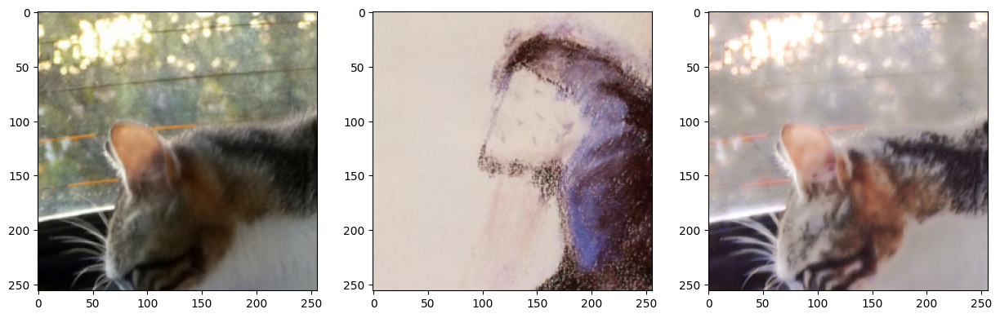

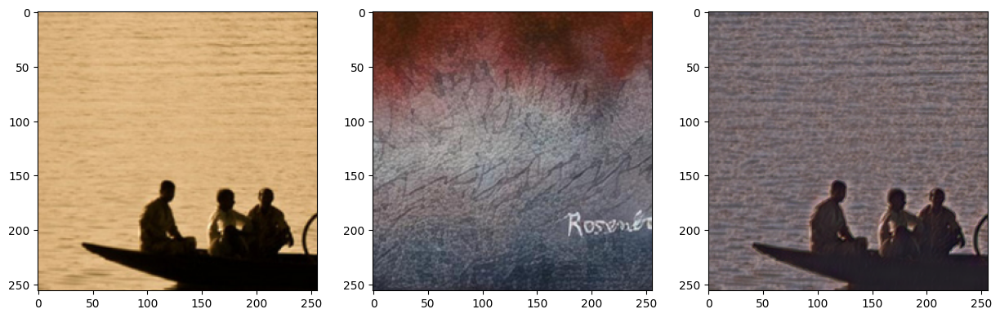

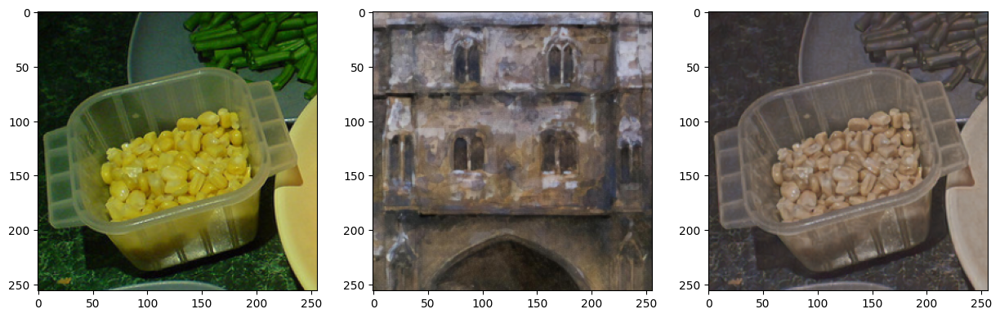

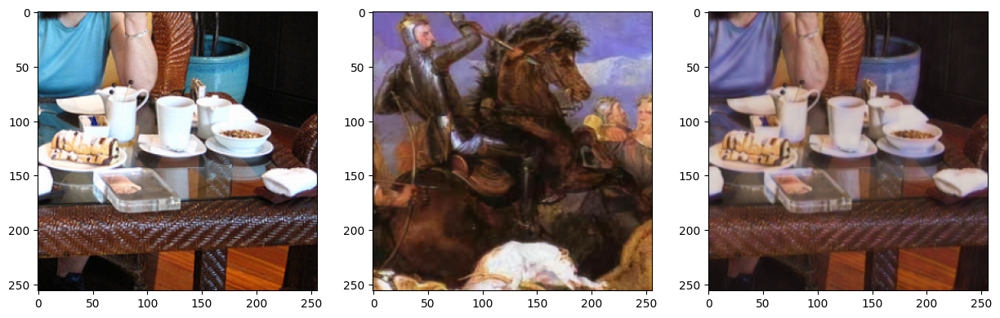

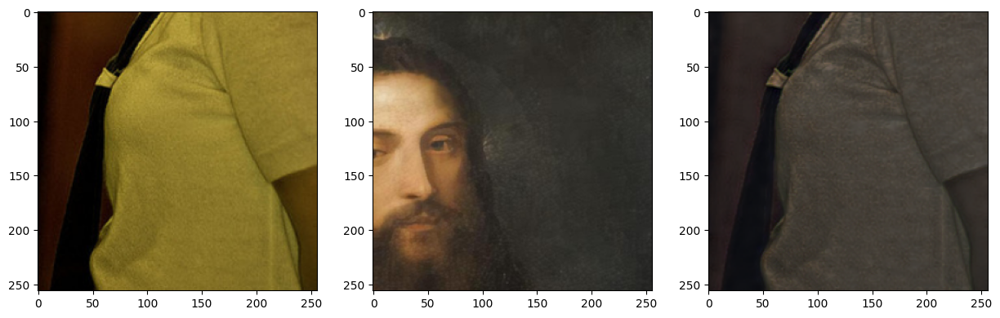

...

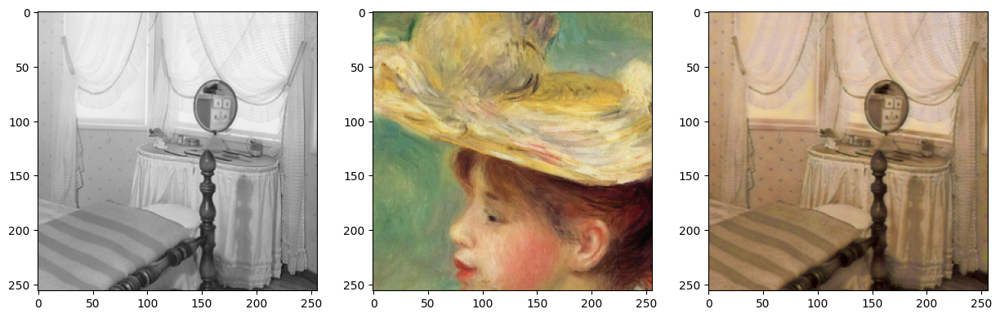

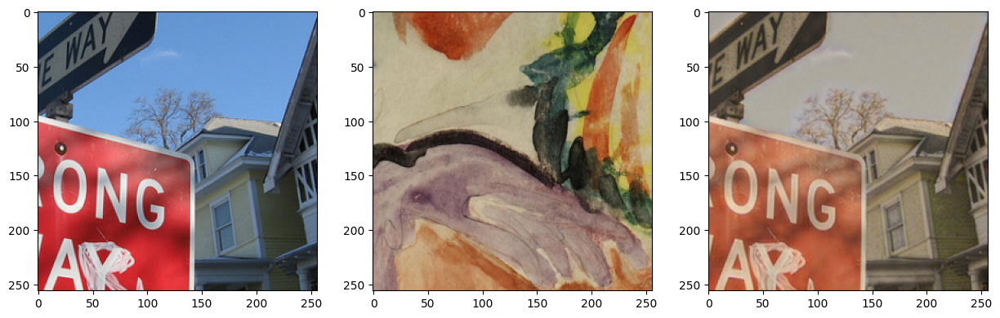

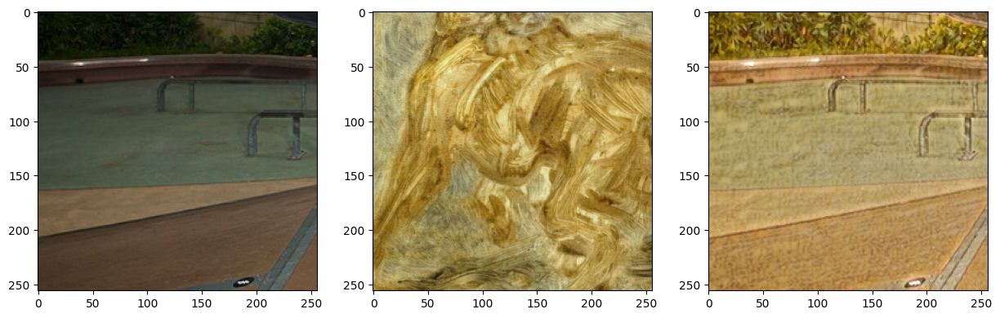

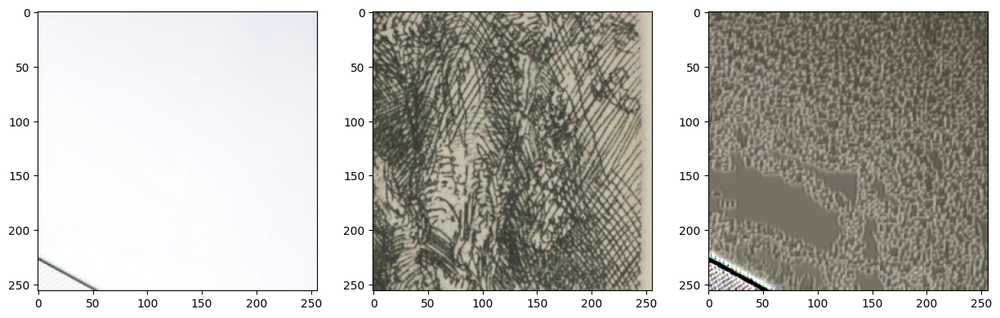

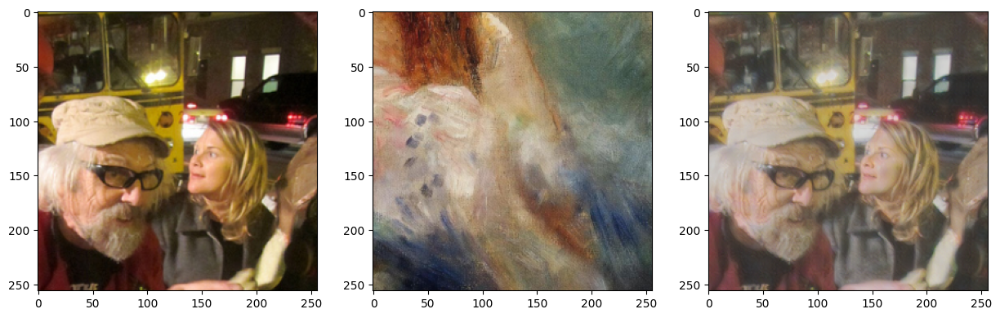

In [6]:
import matplotlib.pyplot as plt

for gen in imgs :
    fig, axs = plt.subplots(1,3, figsize=(15,5))
    for i in range(3) :
        axs[i].imshow(gen[i])
    plt.show()

In [14]:
wolf = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wolf_forest.jpg')
van_gogh = Path('D:/StyleTransferAI/StyleTransferAI/test_images/van_gogh.jpg')
nature = Path('D:/StyleTransferAI/StyleTransferAI/test_images/nature.jpg')
wp = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wallpaper.jpg')
wolf_big = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wolf_forest_big.jpg')
lion = Path('D:/StyleTransferAI/StyleTransferAI/test_images/lion.jpg')
fishes = Path('D:/StyleTransferAI/StyleTransferAI/test_images/peinture.webp')
drawing = Path('D:/StyleTransferAI/StyleTransferAI/test_images/croquis.jpg')
city = Path('D:/StyleTransferAI/StyleTransferAI/test_images/city.jpg')
oil_paint = Path('D:/StyleTransferAI/StyleTransferAI/test_images/oil_paint.jpg')

size = 1500

wolf_img = torch.tensor(keras.utils.img_to_array(keras.utils.load_img(wolf))).unsqueeze(0)
sec_size = int((wolf_img.shape[2] / wolf_img.shape[1]) * size)
scaled_wolf = torch.nn.functional.interpolate(wolf_img.permute((0,3,1,2)), (size,sec_size), mode='bilinear').type(torch.int).permute((0,2,3,1))[0]

lion_img = torch.tensor(keras.utils.img_to_array(keras.utils.load_img(lion))).unsqueeze(0)
sec_size_lion = int((lion_img.shape[2] / lion_img.shape[1]) * size)
scaled_lion = torch.nn.functional.interpolate(lion_img.permute((0,3,1,2)), (size,sec_size_lion), mode='bilinear').type(torch.int).permute((0,2,3,1))[0]

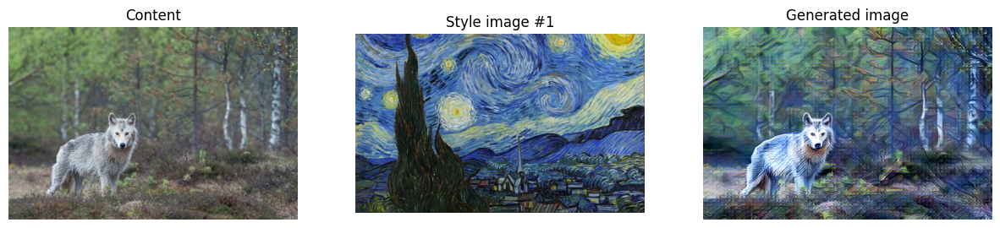

In [8]:
model.generate(wolf, van_gogh, show_img=True, show_inputs=True, resize_size=None)

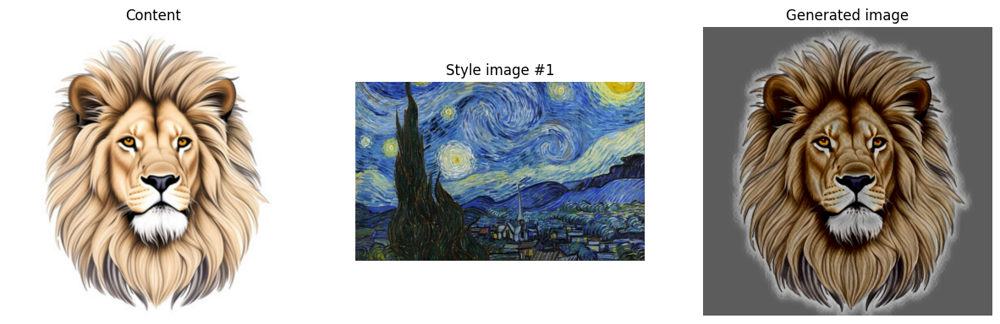

In [9]:
model.generate(scaled_lion, van_gogh, preserve_colors=True, show_img=True, show_inputs=True)

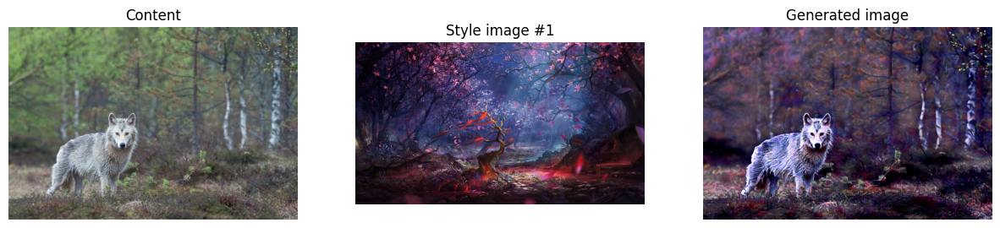

In [10]:
model.generate(wolf, wp, show_img=True, show_inputs=True)

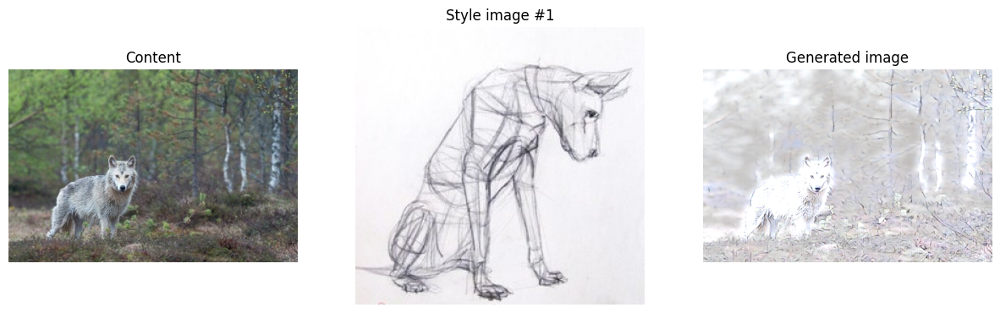

In [13]:
model.generate(wolf, drawing, show_img=True, show_inputs=True, style_scales=0.2)

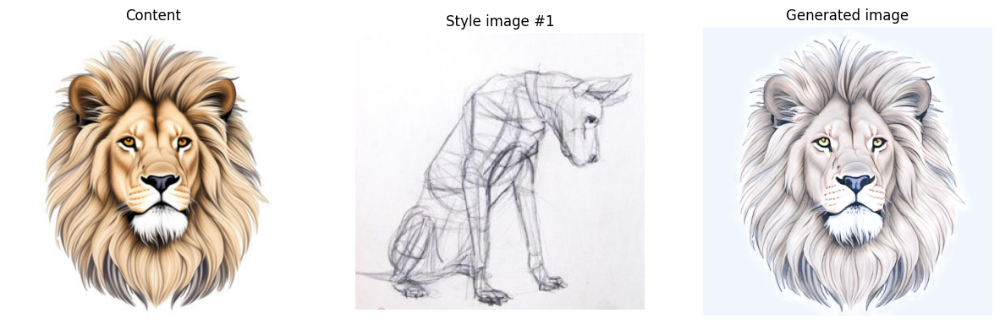

In [12]:
model.generate(scaled_lion, drawing, show_img=True, show_inputs=True, style_scales = 0.2)

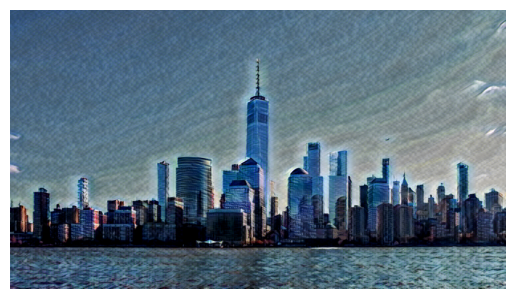

In [17]:
model.generate(city, van_gogh, show_img=True)